# Imports

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import glob
import random

# Q1 : Image Mosaicing

## Part 1)  Feature Detectors and Descriptors


### SIFT Detector Algorithm

While trying to detect key points in an image, the goal is to look for unique regions in the image that are matchable/recognizable. This uniqueness in the detected features prevents ambiguity while matching two images of the same object but taken under different circumstances (this could be change in lighting, orientation etc).

The characteristics of good feature detectors are that :

* They should be areas of reasonable amount of distinctiveness
* If a small window is moved around a particular point in the image and it results in a high change when moved in any direction even for a very small motion, then we can consider that point to be a good feature. Such feature points are often corners in images.

The common example of Harris Corner detector is one such feature detector that is invariant to rotation. However it is not invariant to scaling. This is where ***Scale Invariant Feature Transform (SIFT)*** is useful. There are 4 major steps involved in SIFT :

1. **Feature point detection** : Here scale space filtering is used. The Laplacian of Gaussian (edge detector) is computed for each scale of the image for various values of $\sigma$. To make this computationally more efficient, the *Difference of Gaussians* is used instead of LoG. After computing the DoGs for the image over different scales and different values of $\sigma$ the local extremas for the search space are computed. That is, a pixel in one scale is compared with its neighbours and if it is a local extrema, that point is selected. <br>

2. **Keypoint Localization** : This step is to refine and filter out the keypoints that have been obtained from the previous step. It ensures that no trivial (low-constrast) points are considered. The DoG has a high response for edges and so edges must be removed. This is done similar to harris corner detector, with the help of a pre-defined threshold. <br>

3. **Orientation Assignment** : The entire image is divided into 16x16 squares, and 16 groups of 4x4 pixels each are considered. For each box, the corresponding gradient histograms are computed. This orientation helps to achieve invariance to image rotation. The orientation histogram has 36 bins covering the 360-degree range of orientations.<br>

4. **Keypoint Descriptor** : For this, the 4×4 spatial grid of gradient angle histograms is used. The dimensions of the grid are dependent on the feature point scale and the grid is centered on the feature point and rotated to the orientation determined for the keypoint. For each sub-block, an 8 bin orientation histogram is created. So a total of 128 bin values are available. It is represented as a vector to form keypoint descriptor.<br>

In [2]:
def perform_orb_match(im1, im2, ratio=0.7):
    
    #initialize sift : TODO: why use ORB Create
    sift = cv2.ORB_create()
    
    #get keypoints/detectors and desrcriptors
    kp1, des1 = sift.detectAndCompute(im1, None)
    kp2, des2 = sift.detectAndCompute(im2, None)

    #perform feature matching
    feature_match = cv2.BFMatcher()
    
    #match_points = feature_match.match(des1,des2)
    match_points = feature_match.knnMatch(des1,des2, k=2)
        
    #eliminate trivial descriptors
    non_trivial = []
    for m in match_points:
        if (m[0].distance < ratio*m[1].distance):
            non_trivial.append(m)
    match_points = np.asarray(non_trivial)
    
        
    im1_pts = np.float32([ kp1[m.queryIdx].pt for m in match_points[:,0] ]).reshape(-1,2)
    im2_pts = np.float32([ kp2[m.trainIdx].pt for m in match_points[:,0] ]).reshape(-1,2)
    
    return match_points, kp1, kp2, im1_pts, im2_pts
    

In [3]:
def perform_sift_match(im1, im2, ratio=0.6):
    
    sift = cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(im1,None)
    kp2, des2 = sift.detectAndCompute(im2,None)
    
    match = cv2.BFMatcher()
    match_points = match.knnMatch(des1,des2,k=2)
    
    non_trivial = []
    print("ratio test")
    for m,n in match_points:
        if m.distance < ratio*n.distance:
            non_trivial.append(m)
            
    im1_pts = np.float32([ kp1[m.queryIdx].pt for m in non_trivial ]).reshape(-1,2)
    im2_pts = np.float32([ kp2[m.trainIdx].pt for m in non_trivial ]).reshape(-1,2)
    
    return match_points, kp1, kp2, im1_pts, im2_pts

### CV2 SIFT detectors and descriptors

**SIFT Variants in CV2**

There are multiple variants of the SIFT detector in CV2 namely - sift, orb, surf etc. In this assignment, sift and orb have been used. **ORB** ORB is a fusion of the FAST key point detector and BRIEF descriptor with some modifications. SIFT detects many more points compared to ORB.

**Variants in Matchers**

In the matchers as well, there are two variants, the BF Matcher and the Flann based Matcher. **BF Matcher** (brute force matcher) matches the descriptor of a feature from one image with all other features of another image and returns the match based on the distance. It is relativelt slow since it checks for a match with all the features. **Flann Matcher** is Fast Library for Approximate Nearest Neighbors and it contains a collection of algorithms optimized for fast nearest neighbor search. It is faster than BF Matcher. 

The ```sift.detectAndCompute``` operation returns a list of *keypoint* type objects that have attributes as distance, pt and many more. These are then used to compute the set of desired feature points. 

References
* [Francium Tech Blog](https://blog.francium.tech/feature-detection-and-matching-with-opencv-5fd2394a590)
* [Image Stitching Blog Medium](https://medium.com/analytics-vidhya/image-stitching-with-opencv-and-python-1ebd9e0a6d78)
* [CV2 Tutorial](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_matcher/py_matcher.html)

In [4]:
def get_points_from_match(match_points, kp1, kp2):
    
    im1_pts = np.float32([ kp1[m.queryIdx].pt for m in match_points[:,0] ]).reshape(-1,2)
    im2_pts = np.float32([ kp2[m.trainIdx].pt for m in match_points[:,0] ]).reshape(-1,2)
    
    return im1_pts, im2_pts

In [5]:
#load amphi image and test sift
amphi1 = cv2.imread('../images/Image Mosaicing/1_1.jpg')
amphi1 = cv2.cvtColor(amphi1, cv2.COLOR_BGR2RGB)

amphi2 = cv2.imread('../images/Image Mosaicing/1_2.jpg')
amphi2 = cv2.cvtColor(amphi2, cv2.COLOR_BGR2RGB)

In [6]:
match_points_test, kp1_test, kp2_test, im1_pts_test, im2_pts_test = perform_orb_match(amphi1, amphi2)

In [7]:
print(im1_pts_test.shape, im2_pts_test.shape)

(23, 2) (23, 2)


In [8]:
# match_image = cv2.drawMatches(amphi1, kp1, amphi2, kp2, match_points[:50], amphi2, flags=2)
draw_params = dict(matchColor = (0,255,0), singlePointColor = None, flags = 2)
match_image = cv2.drawMatchesKnn(amphi1, kp1_test, amphi2, kp2_test, match_points_test, None, **draw_params)

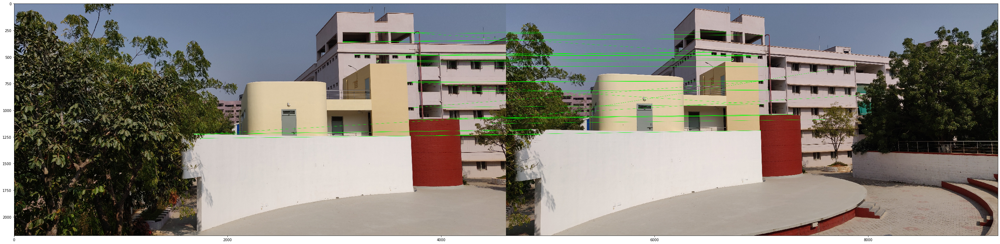

In [9]:
fig = plt.figure(figsize = (50,30))
plt.imshow(match_image)

## Part 2) Estimating Homography Matrix

Once the keypoints for the two (or more) images that are to be matched are obtained, the next step is to compute the homography matrix. For images that form a panaromic view, they are related by a homography.

To compute the $H$ matrix, **RANSAC** is used. The best matrix that has maximum number of inliers - or the model that fits the problem the best - is iteratively found using ransac. Further, given a set of points $\{x_i, y_i\}$ from one image and another set of points $\{{x_i}', y_i'\}$ from another image, the homography matrix can be computed via ***DLT***. Each pair of points gives 2 equations that are appended to the matrix H. The matrix is then decomposed using SVD and the smallest eigenvector (last column) of the matrix corresponds to the homography matrix that minimizes the error of the solution for the system of equations.  

The mathematical representation for the above is as follows : 

$$p_i = \begin{bmatrix}
-x_i \quad -y_i \quad -1 \quad 0 \quad 0 \quad 0 \quad x_ix_i' \quad y_ix_i' \quad x_i' \\
0 \quad 0 \quad 0 \quad -x_i \quad -y_i \quad -1 \quad x_iy_i' \quad y_iy_i' \quad y_i'
\end{bmatrix}$$

Reference links : 
* [Homography](https://medium.com/@navekshasood/image-stitching-to-create-a-panorama-5e030ecc8f7)
* [DLT Computation](https://math.stackexchange.com/questions/494238/how-to-compute-homography-matrix-h-from-corresponding-points-2d-2d-planar-homog)

In [10]:
def compute_homography_matrix(im1_pts, im2_pts):
    
    H = []
    for i in range(len(im1_pts)):
        
        xi = im1_pts[i][0]
        yi = im1_pts[i][1]
        xibar = im2_pts[i][0]
        yibar = im2_pts[i][1]
        
        r1 = [-xi, -yi, -1, 0, 0, 0, xi*xibar, yi*xibar, xibar]
        r2 = [0, 0, 0, -xi, -yi, -1, xi*yibar, yi*yibar, yibar]
        
        H.append(r1)
        H.append(r2)
        
    H = np.asarray(H)
    U, S, V = np.linalg.svd(H)

    P = V[-1, :]
    P = P.reshape(3,3)
    P = P / P[-1,-1]

    return P

In [11]:
def get_num_inliers(pred, orig, thresh):
    
    err_vec = np.mean( (pred - orig)**2, 1)
    err = np.sum(err_vec)
    inliers = orig[err_vec <= thresh]
    inliers_count = inliers.shape[0]
    
    return inliers_count, err
    
'''
implement ransac and use the homography matrix to do so : xa = Hab xb

'''
def perform_ransac_homography(im_a_pts, im_b_pts, itr = 1000, thresh = 0.1):
        
    sample = 8 #atleast 4 points required for homography
    N = im_b_pts.shape[0]
    
    max_inliers = -1
    best_err = 1e12
    
    for i in range(itr):
    
        sample_rows = np.random.choice(N, size=sample, replace=False)
        im_b_pts_sample = im_b_pts[sample_rows, :]
        im_a_pts_sample = im_a_pts[sample_rows, :]
        
        #mapping points from im b to im a : thereforecomputing Hba
        P = compute_homography_matrix(im_b_pts_sample, im_a_pts_sample)
                
        pred_im_pts = np.dot(P, np.append(im_b_pts, np.ones((N,1)), axis=1).T)
        pred_im_pts = pred_im_pts / pred_im_pts[2, :]
        
        pred_im_pts = pred_im_pts[:2,:].T       
        inliers, err = get_num_inliers(pred_im_pts, im_a_pts, thresh) 
                
        if inliers >= max_inliers:
            if err <= best_err:
                best_P = np.copy(P)
                max_inliers = inliers
                best_err = err
            
        #print(P,"inl", inliers, "err", err, "\n")

    return best_P, best_err, max_inliers

In [12]:
def crop_image(image, threshold=1):   
    mask = image>threshold
    if image.ndim==3:
        mask = mask.all(2)
    
    mask0 = mask.any(0)
    mask1 = mask.any(1)

    return image[np.ix_(mask1,mask0)]

In [13]:
def stitch(img_a, img_b, H, stitch_type):
    
    if stitch_type == 1:
        #Option1 : crops the warped images
        w,h = img_a.shape[1] + img_b.shape[1], img_a.shape[0] + img_b.shape[0]
        img_stitch = cv2.warpPerspective(img_b, H, (w,h))
        img_stitch[0:img_a.shape[0], 0:img_a.shape[1], :] = img_a
    
    elif stitch_type == 2:
        #Option 2: translates and doesn't cut (better)
        h1,w1 = img_a.shape[:2]
        h2,w2 = img_b.shape[:2]
        pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
        pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
        pts2_ = cv2.perspectiveTransform(pts2, H)
        pts = np.concatenate((pts1, pts2_), axis=0)
        [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
        t = [-xmin,-ymin]
        Ht = np.array([[1,0,t[0]],[0,1,t[1]],[0,0,1]]) # translate

        img_stitch = cv2.warpPerspective(img_b, Ht.dot(H), (xmax-xmin, ymax-ymin))
        img_stitch[t[1]:h1+t[1],t[0]:w1+t[0]] = img_a
    
    img_stitch = crop_image(img_stitch,20)
    
    return img_stitch


## Part 3) : Transform one image WRT other

Since the two images, that are under consideration, have slightly overlapping regions, the feature points in these overlapping regions are related by a homography matrix in both the images. That is, given a point in image1, we can compute the corresponding feature point in image 2. 

**Explanation of Transformation**
In this implementation given points from ```im1``` and ```im2``` the function computes the homography matrix such that it maps points in image 2 to points in image 1. Mathematically :  

$$x1 = H12x2$$

Therefore from the previous homography matrix computation formulae, the $\{x_i,y_i\}$ points will be the points in image 2 and the corresponding $\{x_i',y_i'\}$ points will be the points in image 1; since the mapping is from image 2 to image 1.

In [14]:
H, _, _ = perform_ransac_homography(im1_pts_test, im2_pts_test)

## Part 4) : Stitching the two images

Once the homography matrix for the partially overlapping images is obtained, in order to stitch the two images together, one image is transformed with respect to the other image's perspective using the homography matrix. 

In order to conveniently stitch the images, they are stitched from R-L. The right image is warped wrt the left image's persepctive and then left image is then simply superimposed onto the warped right image, starting from the top left pixel.

**Generating Panaromas**

The same principle is extended from two images to multiple images. The images are stitched from right to left each time combining 2 images per iteration. Finally the combined stitched mosaic is obtained. 

In tha case where the images are not just along a straight line (R-L), but also top and bottom, the top and bottom scenes are independently stitched after which the two scenes are stitched together to get the final image. 

In [15]:
img = stitch(amphi1, amphi2, H, 2)

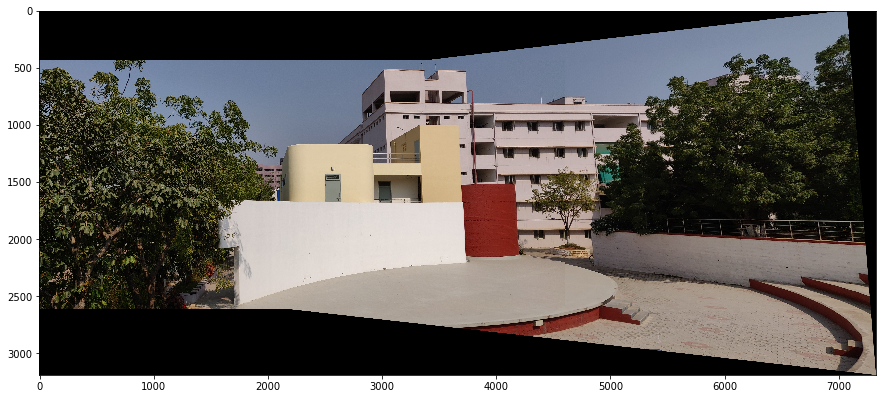

In [16]:
fig = plt.figure(figsize = (15,15))
plt.imshow(img)

## Part 5) : Generating Panaroma

In [17]:
def create_panaroma(images, stitch_type, match_thresh = 0.6, MATCH = "orb", iter_thresh=100):
    
    panaroma = images[len(images)-1]
    
    for j in range(0,len(images)):
        i = len(images)-1-j
        
        if MATCH == "orb":
            match_points, kp1, kp2, im1_pts, im2_pts = perform_orb_match(images[i],panaroma, match_thresh)
        else:
            match_points, kp1, kp2, im1_pts, im2_pts = perform_sift_match(images[i],panaroma, match_thresh)
            
        print(len(match_points), len(im1_pts), len(im2_pts))
        
        #to show matches per stitching iteration
        '''
        match_image = cv2.drawMatches(amphi1, kp1, amphi2, kp2, match_points[:50], amphi2, flags=2)
        draw_params = dict(matchColor = (0,255,0), singlePointColor = None, flags = 2)
        match_image = cv2.drawMatchesKnn(images[i], kp1, panaroma, kp2, match_points_test, None, **draw_params)
        fig = plt.figure(figsize = (50,30))
        plt.imshow(match_image)
        '''
        
        H, _, _ = perform_ransac_homography(im1_pts, im2_pts, iter_thresh)
        panaroma = stitch(images[i], panaroma, H, stitch_type)
        
    return panaroma
    

In [18]:
# def create_panaroma_random():

#TODO : Bonus Implementation

In [19]:
amphi_images = sorted(glob.glob('../images/Image Mosaicing/1*'))
amphi_im = []

for amphi in amphi_images:
    im = cv2.cvtColor(cv2.imread(amphi),cv2.COLOR_BGR2RGB)
    amphi_im.append(im)

In [22]:
amphi_panaroma = create_panaroma(amphi_im, 2, 0.75)

500 500 500
72 72 72
75 75 75
38 38 38


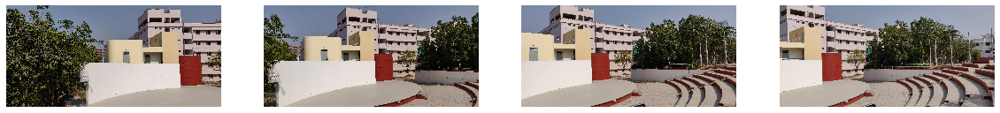

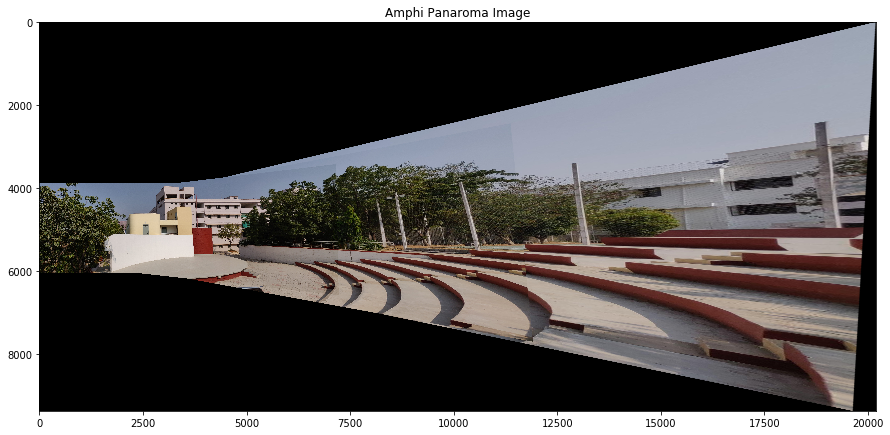

In [23]:
fig, ax = plt.subplots(1, len(amphi_im), figsize = (20,10))
for i,im in enumerate(amphi_im):
    ax[i].imshow(im)
    ax[i].axis('off')

fig = plt.figure(figsize = (15,15))
plt.title("Amphi Panaroma Image")
plt.imshow(amphi_panaroma)

## Part 6) : Experimenting with images

( Tip : if errors occur, check if all images are 8 bit images or no : [link](https://stackoverflow.com/questions/50298329/error-5-image-is-empty-or-has-incorrect-depth-cv-8u-in-function-cvsift))

In [24]:
tajmahal_images = sorted(glob.glob('../images/Image Mosaicing/2*'))
taj_im_top = []
taj_im_bottom = []

for i,taj in enumerate(tajmahal_images):
    im = cv2.cvtColor(cv2.imread(taj),cv2.COLOR_BGR2RGB)
    
    if i < 3:
        taj_im_top.append(im)
    else:
        taj_im_bottom.append(im)

In [25]:
taj_panaroma_top = create_panaroma(taj_im_top, 2)

484 484 484
108 108 108
139 139 139


In [26]:
taj_panaroma_bottom = create_panaroma(taj_im_bottom, 2)

490 490 490
68 68 68
47 47 47


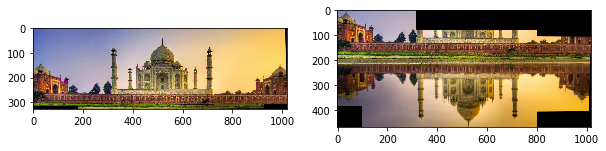

In [27]:
fig, ax = plt.subplots(1,2, figsize=(10,10))

ax[0].imshow(taj_panaroma_top)
ax[1].imshow(taj_panaroma_bottom)

In [28]:
#stitching top and bottom image

taj_panaroma = create_panaroma([taj_panaroma_top, taj_panaroma_bottom], 2)

500 500 500
55 55 55


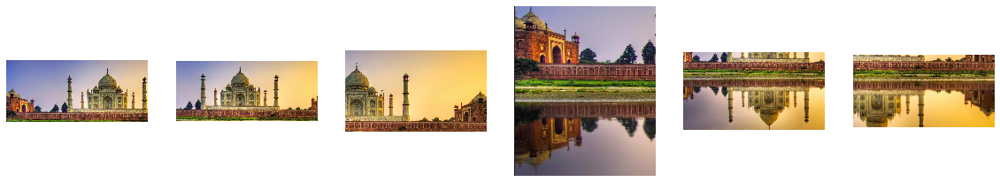

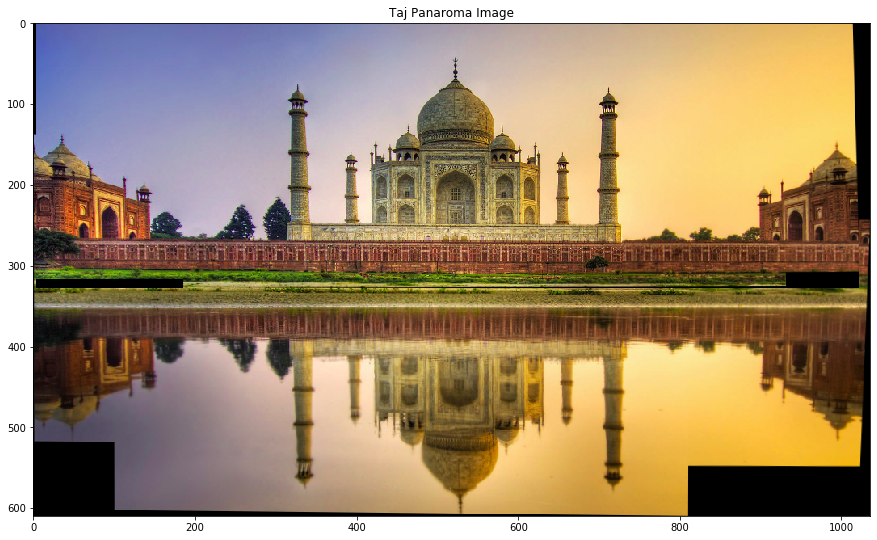

In [29]:
fig, ax = plt.subplots(1, len(tajmahal_images), figsize = (20,10))
i = 0
for im in (taj_im_top):
    ax[i].imshow(im)
    ax[i].axis('off')
    i+=1
    
for im in (taj_im_bottom):
    ax[i].imshow(im)
    ax[i].axis('off')
    i+=1

fig = plt.figure(figsize = (15,15))
plt.title("Taj Panaroma Image")
plt.imshow(taj_panaroma)

In [30]:
rock_images = sorted(glob.glob('../images/Image Mosaicing/3*'))
rock_im = []

for i,rock in enumerate(rock_images):
    im = cv2.cvtColor(cv2.imread(rock),cv2.COLOR_BGR2RGB)
    rock_im.append(im)

In [31]:
rock_panaroma = create_panaroma(rock_im,2,  0.7)

500 500 500
15 15 15


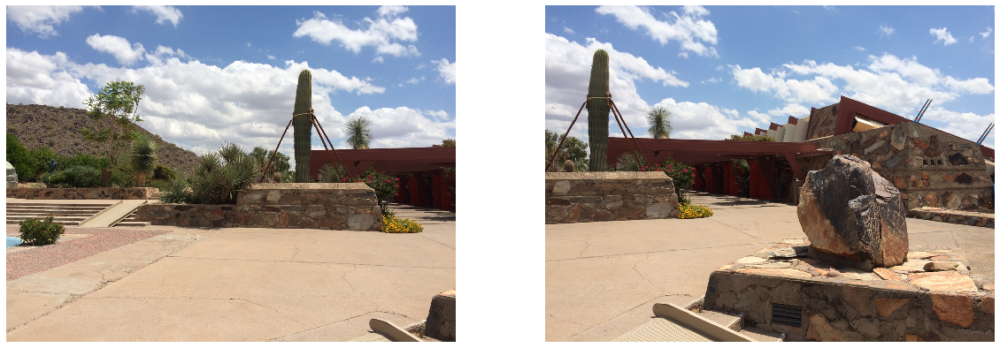

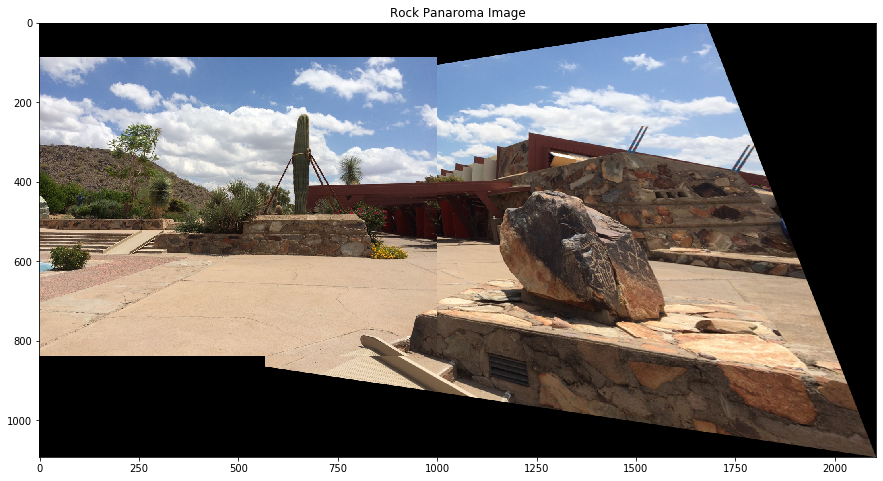

In [32]:
fig, ax = plt.subplots(1, len(rock_im), figsize = (20,10))
for i,im in enumerate(rock_im):
    ax[i].imshow(im)
    ax[i].axis('off')

fig = plt.figure(figsize = (15,15))
plt.title("Rock Panaroma Image")
plt.imshow(rock_panaroma)

In [39]:
himalaya_images = sorted(glob.glob('../images/Image Mosaicing/5*'))
himalaya_im_top = []
himalaya_im_bottom = []

for i,himalaya in enumerate(himalaya_images):
    im = cv2.cvtColor(cv2.imread(himalaya),cv2.COLOR_BGR2RGB)
    
    if i<2:
        himalaya_im_top.append(im)
    else:
        himalaya_im_bottom.append(im)

himalaya_im_bottom.append(himalaya_im_bottom[0])
himalaya_im_bottom = himalaya_im_bottom[1:]

In [55]:
himalaya_panaroma_top = create_panaroma(himalaya_im_top, 2, 0.65)

500 500 500
8 8 8


In [56]:
himalaya_panaroma_bottom = create_panaroma(himalaya_im_bottom,2, 0.65)

500 500 500
16 16 16


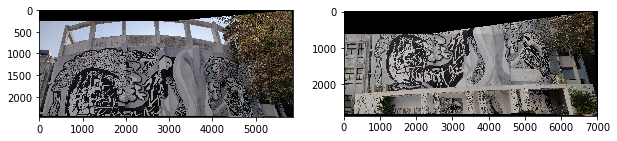

In [57]:
fig, ax = plt.subplots(1,2, figsize=(10,10))

ax[0].imshow(himalaya_panaroma_top)
ax[1].imshow(himalaya_panaroma_bottom)

In [58]:
# himalaya_panaroma = create_panaroma([himalaya_panaroma_top, himalaya_panaroma_bottom], 0.65)

himalaya_panaroma = create_panaroma([himalaya_panaroma_top, himalaya_panaroma_bottom], 2, 0.7)

500 500 500
9 9 9


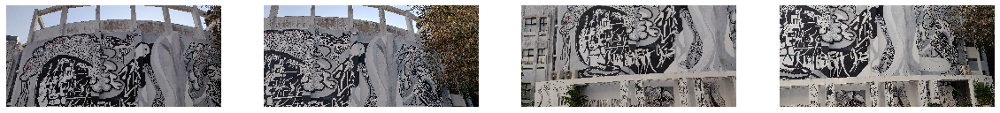

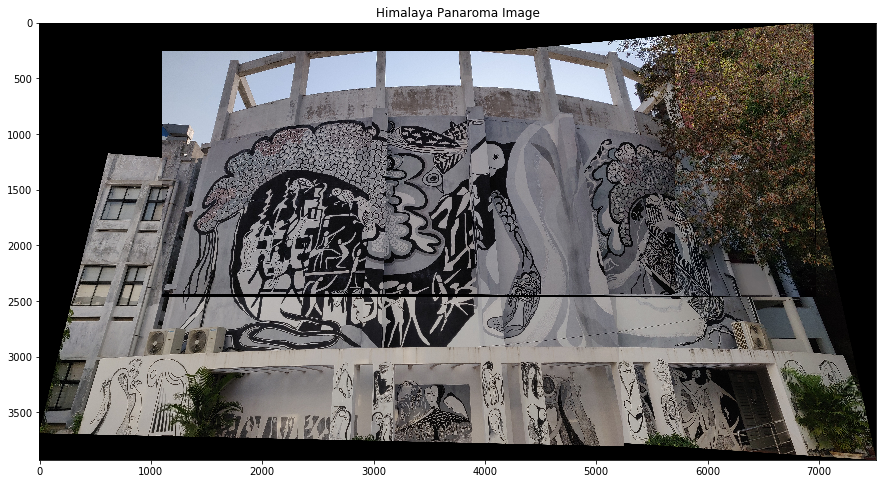

In [59]:
fig, ax = plt.subplots(1, len(himalaya_images), figsize = (20,10))
i = 0
for im in (himalaya_im_top):
    ax[i].imshow(im)
    ax[i].axis('off')
    i+=1
    
for im in (himalaya_im_bottom):
    ax[i].imshow(im)
    ax[i].axis('off')
    i+=1

fig = plt.figure(figsize = (15,15))
plt.title("Himalaya Panaroma Image")
plt.imshow(himalaya_panaroma)

In [60]:
text_images = sorted(glob.glob('../images/Image Mosaicing/4*'))
text_im = []

for i,text in enumerate(text_images):
    im = cv2.cvtColor(cv2.imread(text),cv2.COLOR_BGR2RGB)
    text_im.append(im)

In [61]:
text_panaroma = create_panaroma(text_im, 1, 0.65, "SIFT")

ratio test
92 92 92
ratio test
99 11 11


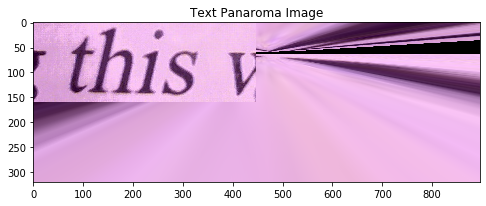

In [62]:
fig = plt.figure(figsize = (8,8))
plt.title("Text Panaroma Image")
plt.imshow(text_panaroma)

### Inference 

From all the above panaromic stitched images that are generated, we observe that the partially overlapping images are stitched very close to what the actual scene looks like. An interesting observation is that the RANSAC algorithm could result in some terrible stitching at times. This is due to the inherent randomness in the algorithm. Increasing the number of iterations is one hyperparameter that can be tweaked for the same. Another hyperparameter is the *threshold* for the *non-trivial* points that get considered by the SIFT/ORB detector. This can also be modified for better results. 

**Observation for Text Image**

On trying to stitch the text image *this week* we observe that the results are not satisfactory. For large threshold values, some of the keypoints that are not the best also get selected. And for smaller thersholds, there aren't sufficient number of matches to compute the homography matrix (at least 4) and thus stitch the image. 

## Part 7) : Creating Panaroma with my data 

In [69]:
my_images = sorted(glob.glob('../images/Image Mosaicing/own*'))
my_im = []

for my in my_images:
    im = cv2.cvtColor(cv2.imread(my),cv2.COLOR_BGR2RGB)
    my_im.append(im)

In [70]:
building_panaroma = create_panaroma(my_im, 2, 0.75)

500 500 500
57 57 57
69 69 69


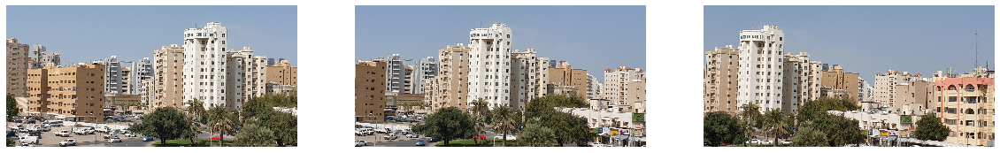

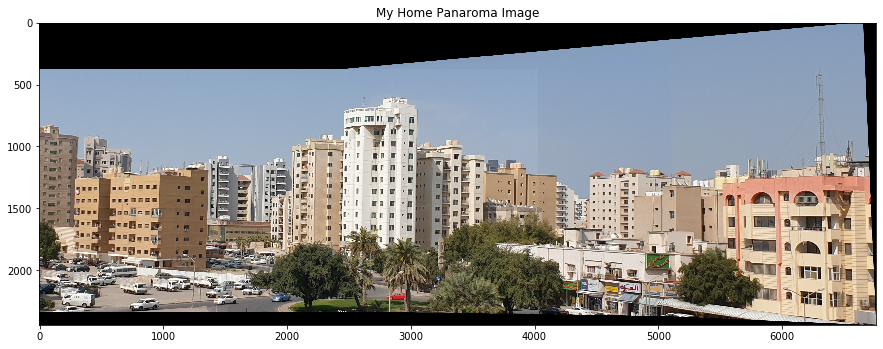

In [71]:
fig, ax = plt.subplots(1, len(my_im), figsize = (20,10))
for i,im in enumerate(my_im):
    ax[i].imshow(im)
    ax[i].axis('off')

fig = plt.figure(figsize = (15,15))
plt.title("My Home Panaroma Image")
plt.imshow(building_panaroma)

# Question 2 : Stero Correspondences

## Part 1) : Intensity based Window Matching

This method uses a brute force technique to compute match points between two images using intensity window based correlation. In this method, instead of matching points in one image to another ***patches*** from one image are matched to the other image. This accounts for the neighbourhood information associated with a pixel in an image. 

The correlation between two patches is found by :
* Concatenating the pixels of the patch to form a column vector
* Subtract the mean of the vectors from itself
* Computign the normalized correlation between two vectors.

Mathematically the formula for normalised correlation for 2 vectors $v_1 and v_2$ is :

1) Mean subtraction
$$ v_1' = v_1 - \bar{v_1} $$
$$ v_2' = v_2 - \bar{v_2} $$

2) Correlation

$$ score = \frac{{v_1'^{T}} \cdot {v_2'^{T}}}{(\sqrt{v_1'^{T}v_1'}) \cdot (\sqrt{v_2'^{T}v_2'})} $$

In [72]:
def similarity_score(v1,v2):
    
    num = np.dot(v1, v2)
    deno = (np.sqrt(np.dot(v1,v1)))*(np.sqrt(np.dot(v2,v2)))
    
    return num/deno


def intensity_correlation(im1, im2, window):

    matches = []
    ht, wd = im1.shape[0], im1.shape[1]
    p = window//2
    #print(p, ht, wd, ht+p, ht-p)
    
    h_points = np.random.choice(ht, size=10, replace=False).reshape(-1,1)
    w_points = np.random.choice(wd, size=10, replace=False).reshape(-1,1)
    
    points = np.hstack((h_points, w_points))
    #print(points)
    
    #matching the patches around the sampled points in im1 to im2
    for point in points:
        
        i = point[0]
        j = point[1]
        
        patch1 = im1[i-p:i+p+1, j-p:j+p+1]
        #v1 = patch1.reshape(patch1.shape[0]*patch1.shape[1]*patch1.shape[2],1)
        v1 = patch1.flatten()
        v1 = v1 - np.mean(v1)
        
        best_score = -1
        best_loc = [-1, -1]

        #check against each patch for im2
        for x in range(p, ht-p):
            for y in range(p, wd-p):

                patch2 = im2[x-p:x+p+1, y-p:y+p+1]
                v2 = patch2.flatten()
                v2 = v2 - np.mean(v2)

                score = similarity_score(v1,v2)
                if score > best_score:
                    best_loc = [x,y]
                    best_score = score

        matches.append([j,i,best_loc[1], best_loc[0]])
    
    return np.array(matches)

In [73]:
def my_draw_matches(im1, im2, points, title):
    
    im1 = np.copy(im1)
    im2 = np.copy(im2)
    ht,wd = im1.shape[0], im1.shape[1]
    print(ht,wd)
    p1 = np.copy(points[:,:2])
    p2 = np.copy(points[:, 2:])
    print(im1.shape, im2.shape)
    
    #this won't work for different sized images
    '''
    #final_image = np.hstack((im1, im2))
    #fig = plt.figure(figsize = (10,10))
    #plt.imshow(final_image)
    #plt.title(title)
    #plt.axis('off')
    '''
    
    fig, ax = plt.subplots(1,2, figsize=(10,8))
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0,hspace=0) 
    plt.suptitle(title,x=0.5,y=0.8)
    
    ax[0].imshow(im1)
    ax[0].axis('off')
    ax[1].imshow(im2)
    ax[1].axis('off')
    
    for i in range(len(points)):
        #ax[0].plot([p1[i][1], p2[i][1]+wd], [p1[i][0],p2[i][0]], linestyle='-', marker='o', color='b', markersize=3)
        
        x1y1 = (p1[i][0], p1[i][1])
        x2y2 = (p2[i][0], p2[i][1])
        con = ConnectionPatch(xyA=x2y2, xyB=x1y1, coordsA="data", coordsB="data",
                              axesA=ax[1], axesB=ax[0], color="b")
        ax[1].add_artist(con)
        ax[0].scatter([p1[i][0]], [p1[i][1]], c='b')
        ax[1].scatter([p2[i][0]], [p2[i][1]], c ='b')

### IMAGE : Rushmore

In [74]:
rushmore_images = sorted(glob.glob('../images/Stereo Correspondence/1*'))
rushmore_im = []

for i,rush in enumerate(rushmore_images):
    im = cv2.cvtColor(cv2.imread(rush),cv2.COLOR_BGR2RGB)
    rushmore_im.append(im)

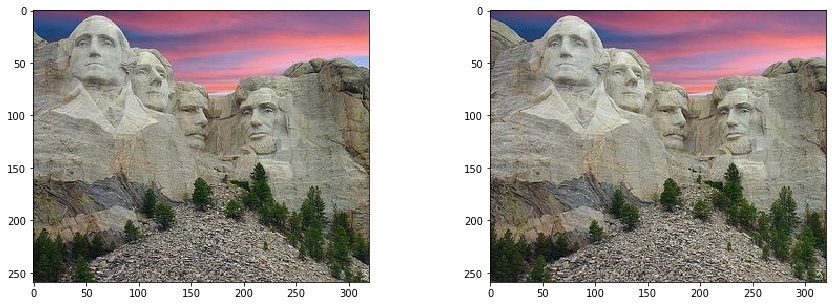

In [75]:
fig, a = plt.subplots(1,2, figsize = (15,5))
a[0].imshow(rushmore_im[0])
a[1].imshow(rushmore_im[1])

In [76]:
%%time
rushmore_matches = intensity_correlation(rushmore_im[0], rushmore_im[1], 3)

CPU times: user 15.5 s, sys: 8.07 ms, total: 15.5 s
Wall time: 15.5 s


259 320
(259, 320, 3) (259, 320, 3)


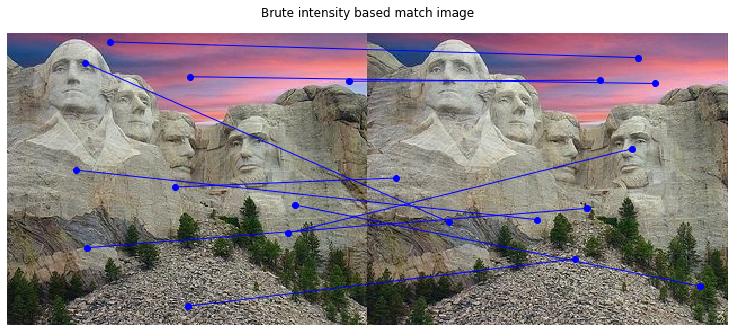

In [77]:
my_draw_matches(rushmore_im[0], rushmore_im[1], rushmore_matches,"Brute intensity based match image")

### IMAGE : Himalaya

In [78]:
himalaya_stereo_images = sorted(glob.glob('../images/Stereo Correspondence/3*'))
himalaya_stereo_im = []

for i,him in enumerate(himalaya_stereo_images):
    im = cv2.cvtColor(cv2.imread(him),cv2.COLOR_BGR2RGB)
    himalaya_stereo_im.append(im)

In [79]:
%%time
himalaya_matches = intensity_correlation(himalaya_stereo_im[0], himalaya_stereo_im[1], 3)

/home/mallika/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  


CPU times: user 3min 29s, sys: 44.6 ms, total: 3min 29s
Wall time: 3min 29s


720 1280
(720, 1280, 3) (720, 1280, 3)


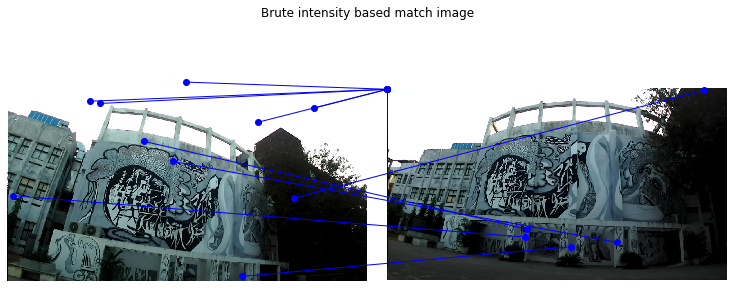

In [80]:
my_draw_matches(himalaya_stereo_im[0], himalaya_stereo_im[1], himalaya_matches,"Brute intensity based match image")

### IMAGE : Taj Mahal

In [81]:
taj_stereo_images = sorted(glob.glob('../images/Stereo Correspondence/2*'))
taj_stereo_im = []

for i,taj in enumerate(taj_stereo_images):
    im = cv2.cvtColor(cv2.imread(taj),cv2.COLOR_BGR2RGB)
    taj_stereo_im.append(im)

In [83]:
%%time
taj_matches = intensity_correlation(taj_stereo_im[0], taj_stereo_im[1], 3)

CPU times: user 45.4 s, sys: 17.1 ms, total: 45.4 s
Wall time: 45.5 s


317 725
(317, 725, 3) (318, 743, 3)


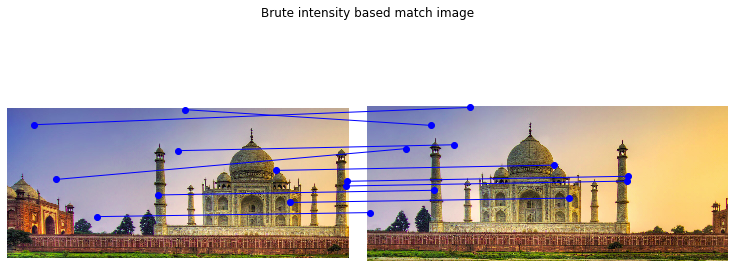

In [84]:
my_draw_matches(taj_stereo_im[0], taj_stereo_im[1], taj_matches,"Brute intensity based match image")

## Part 2) : Finding and Drawing Epipolar Lines

In 2-view geometry, epipolar geometry states that for two images with some overlap that are taken by two different cameras located at 2 different world points, the two images are related by an epipolar constraint. For every point in image1, there exists a corresponding line in image2. Further, there exists a 1-1 correspondence for all the epipolar lines. 

Consider two cameras with camera centers at $o1$ and $o2$. Let the image of a common world point $X$ be $x_1$ in image1 and $x_2$ in image2. Let the world origin coincide with $o_1$. Then, the world point $X$ is a scalar multiple of $x_1$. However for $x_2$, there will be a rotation and translation factor as well. Mathematically: 

$$X = \lambda_1 x_1$$
$$RX + T = \lambda_2 x_2$$

Substituting the two equations and solving we get:

$$ \lambda_2 x_2 = R(\lambda_1 x_1) + T $$
$$ \hat{T} \lambda_2 x_2 = \hat{T}R(\lambda_1 x_1) + \hat{T}T $$
$$ \lambda_2 ( \hat{x}_2^{T}\hat{T}  x_2) =  \lambda_1 ( \hat{x}_2^{T}\hat{T}R  x_1) $$

Thus we get the final equation as :  $x_2^{T} \hat{T}R x_1 = 0$
Here, the matrix $\hat{T}R$ is called the essential matrix. Extending this further, we can incorporate the camera matrix, its focal length etc. also into our formula. This gives us the equation :

$$x_2^{T} F x_1 = 0$$

It can thus be infered that the matrices $E$ and $F$ are independent of the world points. And to obtain lines corresponding to image2, we compute the dot product $F \cdot x_1$ and this gives us a set of lines corresponding to the set of points $x_1$

**CV2 Fundamental matrix algorithms**
While computing the fundamental matrix using cv2, there are many algorithms that can be used as enum parameters. The 4 options are ```FM_7POINT```, ```FM_8POINT```, ```FM_LMEDS```, ```FM_RANSAC```. In this implementation, the RANSAC method is used. The LMEDS was also experimented with (least-median algorithm. 7-point algorithm is used) but the RANSAC variant gave promising results.


In [85]:
NUM_EPI_POINTS = 10

In [86]:
#generate random set of points for images
def gen_random_points(im, num_points=10):
    ht, wd = im.shape[0], im.shape[1]
    h_points = np.random.choice(ht, size=num_points, replace=False).reshape(-1,1)
    w_points = np.random.choice(wd, size=num_points, replace=False).reshape(-1,1)
    points = np.hstack((h_points, w_points))
        
    return points

In [87]:
def drawlines(im, lines, pts, ax):
    
    r,c,_ = im.shape    

    for r, pt in zip(lines, pts.T):
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        color=(255,0,255)
        
        #ax.plot([x0,x1], [y0,y1], linestyle='-', marker='o', markersize=1)
        #ax.scatter([pt[0]], [pt[1]], s = 30)
        
        im = cv2.line(im, (x0,y0), (x1,y1), color ,3)
        im = cv2.circle(im, tuple((int(pt[0]), int(pt[1]))), 3, color, 5)
    
    return im
        

In [88]:
def get_fund_matrix(im1, im2, match_thresh):
    
    match_points, kp1, kp2, im1_pts, im2_pts = perform_sift_match(im1, im2, match_thresh)
    F, mask = cv2.findFundamentalMat(im1_pts, im2_pts, cv2.FM_RANSAC)

    return F, mask, im1_pts, im2_pts
    

def get_epi_lines(im1, im2, draw_epi = True, match_thresh = 0.7, num_points = 5):
    
    im1 = np.copy(im1)
    im2 = np.copy(im2)
    F, mask, pts1, pts2 = get_fund_matrix(im1, im2, match_thresh)
    
    pts1 = pts1[mask.ravel()==1]
    
    pts2 = pts2[mask.ravel()==1]
    print("Fundamental matrix :", pts1.shape, pts2.shape)
    print(F)
    
    
    #selcting random subset of matchpoints
    ind = np.arange( pts1.shape[ 0 ] )
    print("indd", ind.shape)
    
    np.random.shuffle( ind )
    pts1 = pts1[ ind[ :num_points ], : ]
    pts2 = pts2[ ind[ :num_points ], : ]

    
    #get the epipolar lines corresponding to points in image1
    pts1_homo = np.append(pts1, np.ones((len(pts1),1)), axis=1)
    pts2_homo = np.append(pts2, np.ones((len(pts2),1)), axis=1)
    
    lines2 = np.dot(F, pts1_homo.T)
    lines1 = np.dot(pts2_homo, F)
    
    #lines2 = np.dot(F.T, pts2_homo.T)
    print(lines1.shape)
    
    if draw_epi:
        im1 = drawlines(im1, lines1, pts1_homo.T, ax[0])
        im2 = drawlines(im2, lines2.T, pts2_homo.T, ax[1])
    
    return im1, im2 


In [89]:
def plot_epi_lines(im1, im2):
    
    fig, ax = plt.subplots(1,2, figsize=(10,8))
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0,hspace=0) 
    plt.suptitle("Epipolar Lines Image",x=0.5,y=0.8)
    
    ax[0].imshow(im1)
    ax[0].axis('off')
    ax[1].imshow(im2)
    ax[1].axis('off')

## Part 3) : Rectifying the Stereo Pair

From the previous parts it is clear that for each point in image1, there exists a corresponding line in image2. In stereo rectification, the two images are transformed(warped) such that the camera principal axes of the two cameras are **parallel** to one another. In such a case, the epipolar lines are all parallel to one another. 

As a result of this, if the epipolar lines are parallel to one another, then the search space to match points in one image to another gets reduced. Since, for any point in one image, the corresponding point in the other image lies in the same row (since epipolar lines are parallel).

That is, the rectified and the original images are related by a homography. Since it involves the same camera located at the same camera center (or the image under consideration is on the same plane). Therefore the rectified images have a more efficient matching (as shown in the next parts)

In [90]:
def rectify_images(im1, im2, epi_im1, epi_im2, match_thresh = 0.7):
    
    F, mask, pts1, pts2 = get_fund_matrix(im1, im2, match_thresh)  
    print(F)
    pts1 = pts1[mask.ravel() == 1]
    pts2 = pts2[mask.ravel() == 1]
    
    h,w,_ = im1.shape
    
    P, H1, H2 = cv2.stereoRectifyUncalibrated(pts1, pts2, F, (w,h))
    
    rec1 = cv2.warpPerspective(epi_im1, H1, (w,h))
    rec2 = cv2.warpPerspective(epi_im2, H2, (w,h))
    
    #rec1 = crop_image(rec1)
    #rec2 = crop_image(rec2)
    
    return rec1, rec2

### Applying Epipolar and Rectification Funcs to Images

### IMAGE 1 : RUSHMORE

ratio test
Fundamental matrix : (198, 2) (198, 2)
[[ 1.04568233e-06 -3.14118500e-04  2.20930943e-02]
 [ 3.40360000e-04 -4.70364413e-06 -1.61251313e+00]
 [-2.95869198e-02  1.61665123e+00  1.00000000e+00]]
indd (198,)
(5, 3)


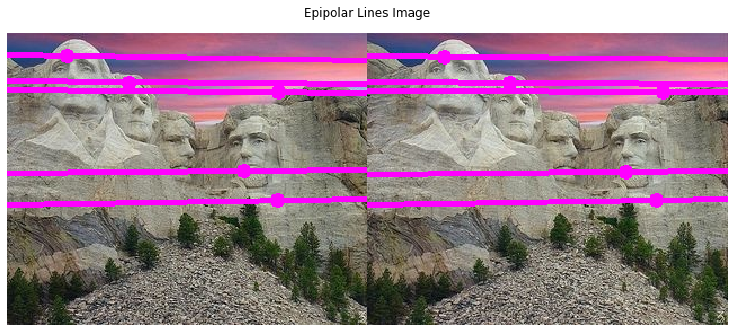

In [91]:
epi_rush1, epi_rush2 = get_epi_lines(rushmore_im[0], rushmore_im[1], True, 0.7)

plot_epi_lines(epi_rush1, epi_rush2)

ratio test
[[ 1.04568233e-06 -3.14118500e-04  2.20930943e-02]
 [ 3.40360000e-04 -4.70364413e-06 -1.61251313e+00]
 [-2.95869198e-02  1.61665123e+00  1.00000000e+00]]


(-0.5, 319.5, 258.5, -0.5)

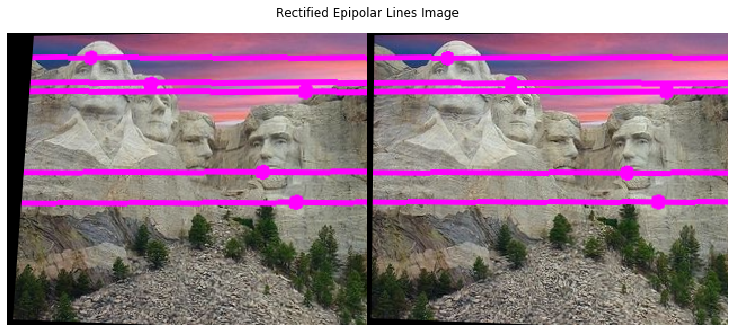

In [92]:
rushmore_rec1, rushmore_rec2 = rectify_images(rushmore_im[0], rushmore_im[1], epi_rush1, epi_rush2, 0.7)
fig, ax = plt.subplots(1,2,figsize=(10,8))

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0,hspace=0) 
plt.suptitle("Rectified Epipolar Lines Image",x=0.5,y=0.8)

ax[0].imshow(rushmore_rec1)
ax[0].axis('off')
ax[1].imshow(rushmore_rec2)
ax[1].axis('off')

### IMAGE 2 : HIMALAYA

ratio test
Fundamental matrix : (661, 2) (661, 2)
[[-1.22252892e-06 -1.27733536e-07  2.36616964e-03]
 [ 4.53984031e-06  1.06487537e-06 -9.41588762e-03]
 [-3.80021297e-03  5.56806034e-03  1.00000000e+00]]
indd (661,)
(5, 3)


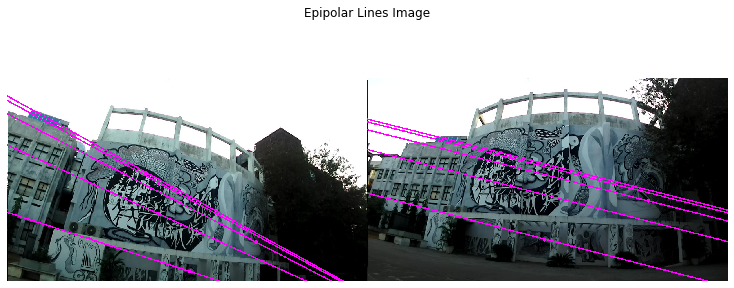

In [93]:
epi_him1, epi_him2 = get_epi_lines(himalaya_stereo_im[0], himalaya_stereo_im[1], True, 0.8)

plot_epi_lines(epi_him1, epi_him2)

ratio test
[[-1.22252892e-06 -1.27733536e-07  2.36616964e-03]
 [ 4.53984031e-06  1.06487537e-06 -9.41588762e-03]
 [-3.80021297e-03  5.56806034e-03  1.00000000e+00]]


(-0.5, 1279.5, 719.5, -0.5)

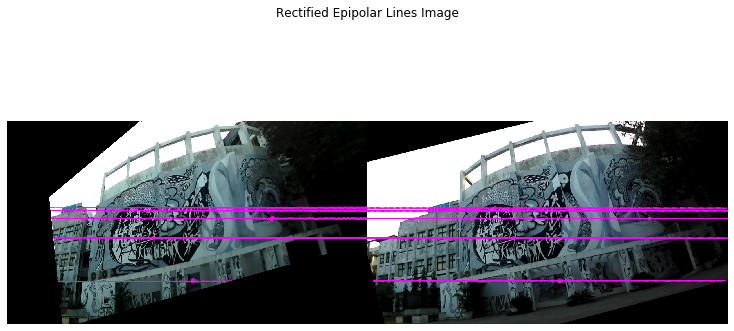

In [94]:
him_rec1, him_rec2 = rectify_images(himalaya_stereo_im[0], himalaya_stereo_im[1], epi_him1, epi_him2, 0.8)
fig, ax = plt.subplots(1,2,figsize=(10,10))

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0,hspace=0) 
plt.suptitle("Rectified Epipolar Lines Image",x=0.5,y=0.8)

ax[0].imshow(him_rec1)
ax[0].axis('off')
ax[1].imshow(him_rec2)
ax[1].axis('off')

### IMAGE 3 : TAJ MAHAL

ratio test
Fundamental matrix : (1043, 2) (1043, 2)
[[ 2.81760013e-21 -1.61221218e-12  4.42473660e-10]
 [ 1.61221182e-12  3.39676922e-19  9.99999919e-02]
 [-4.26351443e-10 -9.99999922e-02  1.00000000e+00]]
indd (1043,)
(5, 3)


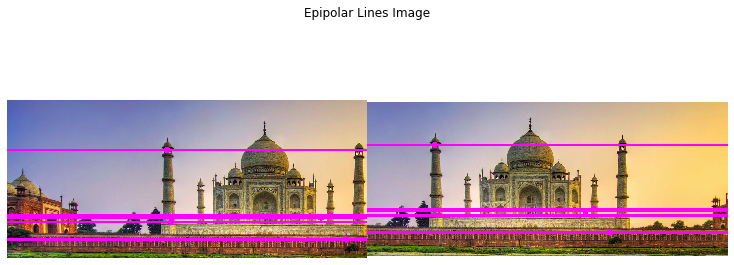

In [95]:
epi_taj1, epi_taj2 = get_epi_lines(taj_stereo_im[0], taj_stereo_im[1], True, 0.8)

plot_epi_lines(epi_taj1, epi_taj2)

ratio test
[[ 2.81760013e-21 -1.61221218e-12  4.42473660e-10]
 [ 1.61221182e-12  3.39676922e-19  9.99999919e-02]
 [-4.26351443e-10 -9.99999922e-02  1.00000000e+00]]


(-0.5, 724.5, 316.5, -0.5)

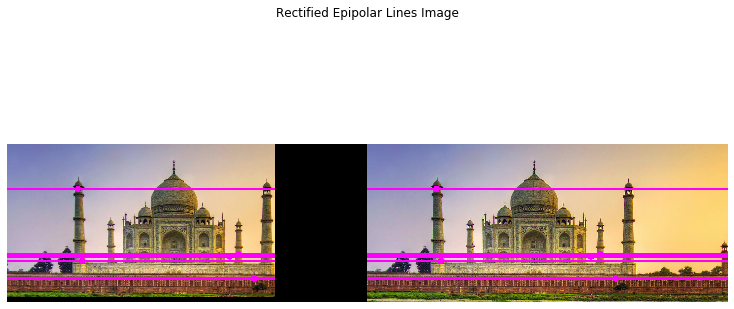

In [96]:
taj_rec1, taj_rec2 = rectify_images(taj_stereo_im[0], taj_stereo_im[1],epi_taj1, epi_taj2, 0.8)
fig, ax = plt.subplots(1,2,figsize=(10,10))

plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0,hspace=0) 
plt.suptitle("Rectified Epipolar Lines Image",x=0.5,y=0.8)

ax[0].imshow(taj_rec1)
ax[0].axis('off')
ax[1].imshow(taj_rec2)
ax[1].axis('off')

## Part 4) : Greedy based Stereo Correspondences

On comparing the brute force and the stereo based correspondences that are obtained between the two images, we observe two major things
1. The run time is lesser for greedy based method
2. More number of matches are correct for the greedy method

The reason for a lower run time of the greedy method is due to the reduced search space. Since the epipolar lines are parallel to one another, for any point in one image, the corresponding point in the other image lies in the same row. For eg: the *brute force* method for the rushmore images took ***15 s Wall time*** while the *greedy based* method for the same rushmore image (but rectified) took  ***172 ms Wall time***. Similarly it took ***3 mins 49s Wall time*** for the himalaya image with brute force but only ***1.45s Wall time*** with greedy search.

Further, because of the 1-1 correspondence between a point in the first image and the corresponding epipolar line in the second image, the matching accuracy is also increased.

In [97]:
def greedy_matching(im1, im2, window, match_thresh1=0.8, match_thresh2=0.7):
    
    #get epipolar lines for the image
    epi_im1, epi_im2 = get_epi_lines(im1, im2, False, match_thresh1)
    
    #rectify the two images
    im1_rec1, im2_rec2 = rectify_images(im1, im2, epi_im1, epi_im2, match_thresh2)
    
    #generate points in image1
    im1_pts = gen_random_points(im1_rec1)
    
    #for each point in im1, search throught the epiline in image2
    matches = []
    ht, wd = im1_rec1.shape[0], im1_rec1.shape[1]
    p = window//2
    
    for point in im1_pts:
        
        i = point[0]
        j = point[1]
        
        if (im1_rec1[i][j]).all() == 0:
            #print("empty point")
            continue
        
        patch1 = im1_rec1[i-p:i+p+1, j-p:j+p+1]
        #v1 = patch1.reshape(patch1.shape[0]*patch1.shape[1]*patch1.shape[2],1)
        v1 = patch1.flatten()
        v1 = v1 - np.mean(v1)
        
        best_score = -1
        best_loc = [-1, -1]
        
        #check against corresponding epiline in image2 ie :x = i
        x = i
        for y in range(p, wd-p):

            patch2 = im2_rec2[x-p:x+p+1, y-p:y+p+1]
            v2 = patch2.flatten()
            v2 = v2 - np.mean(v2)

            score = similarity_score(v1,v2)
            if score > best_score:
                best_loc = [x,y]
                best_score = score

        matches.append([j,i,best_loc[1], best_loc[0]])
        
    return np.array(matches), im1_rec1, im2_rec2

### Applying Greedy Stereo Correspondences

### IMAGE 1 : RUSHMORE

In [98]:
%%time
rushmore_matches_greedy, rush_greedy_rec1, rush_greedy_rec2 = greedy_matching(rushmore_im[0], rushmore_im[1], 3, 0.7, 0.7)

ratio test
Fundamental matrix : (198, 2) (198, 2)
[[ 1.04568233e-06 -3.14118500e-04  2.20930943e-02]
 [ 3.40360000e-04 -4.70364413e-06 -1.61251313e+00]
 [-2.95869198e-02  1.61665123e+00  1.00000000e+00]]
indd (198,)
(5, 3)
ratio test
[[ 1.04568233e-06 -3.14118500e-04  2.20930943e-02]
 [ 3.40360000e-04 -4.70364413e-06 -1.61251313e+00]
 [-2.95869198e-02  1.61665123e+00  1.00000000e+00]]
CPU times: user 496 ms, sys: 36 ms, total: 532 ms
Wall time: 172 ms


/home/mallika/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  


259 320
(259, 320, 3) (259, 320, 3)


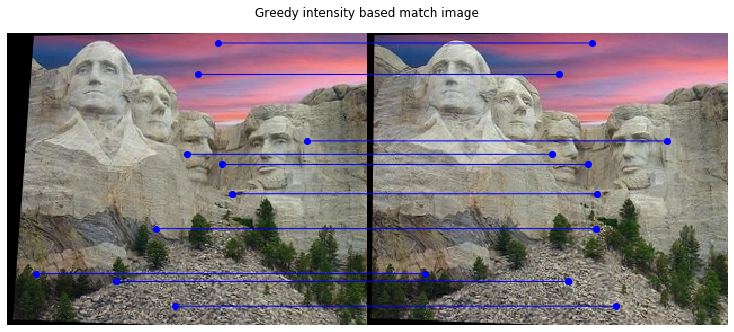

In [99]:
my_draw_matches(rush_greedy_rec1, rush_greedy_rec2, rushmore_matches_greedy, "Greedy intensity based match image")

### IMAGE 2 : HIMALAYA

In [102]:
%%time
himalaya_matches_greedy, him_greedy_rec1, him_greedy_rec2 = greedy_matching(himalaya_stereo_im[0], himalaya_stereo_im[1], 3, 0.8, 0.8)

ratio test
Fundamental matrix : (661, 2) (661, 2)
[[-1.22252892e-06 -1.27733536e-07  2.36616964e-03]
 [ 4.53984031e-06  1.06487537e-06 -9.41588762e-03]
 [-3.80021297e-03  5.56806034e-03  1.00000000e+00]]
indd (661,)
(5, 3)
ratio test
[[-1.22252892e-06 -1.27733536e-07  2.36616964e-03]
 [ 4.53984031e-06  1.06487537e-06 -9.41588762e-03]
 [-3.80021297e-03  5.56806034e-03  1.00000000e+00]]
CPU times: user 6.68 s, sys: 103 ms, total: 6.78 s
Wall time: 1.45 s


/home/mallika/.local/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in double_scalars
  


720 1280
(720, 1280, 3) (720, 1280, 3)


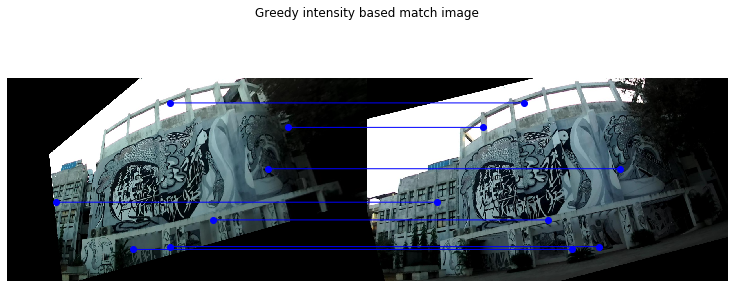

In [103]:
my_draw_matches(him_greedy_rec1, him_greedy_rec2, himalaya_matches_greedy, "Greedy intensity based match image")

### IMAGE 2 : TAJ MAHAL

In [104]:
%%time
taj_matches_greedy, taj_greedy_rec1, taj_greedy_rec2 = greedy_matching(taj_stereo_im[0], taj_stereo_im[1], 3, 0.8, 0.8)

ratio test
Fundamental matrix : (1043, 2) (1043, 2)
[[ 2.81760013e-21 -1.61221218e-12  4.42473660e-10]
 [ 1.61221182e-12  3.39676922e-19  9.99999919e-02]
 [-4.26351443e-10 -9.99999922e-02  1.00000000e+00]]
indd (1043,)
(5, 3)
ratio test
[[ 2.81760013e-21 -1.61221218e-12  4.42473660e-10]
 [ 1.61221182e-12  3.39676922e-19  9.99999919e-02]
 [-4.26351443e-10 -9.99999922e-02  1.00000000e+00]]
CPU times: user 1.24 s, sys: 55.6 ms, total: 1.29 s
Wall time: 344 ms


317 725
(317, 725, 3) (317, 725, 3)


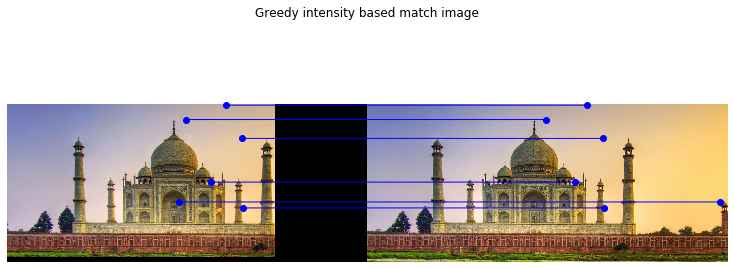

In [105]:
my_draw_matches(taj_greedy_rec1, taj_greedy_rec2, taj_matches_greedy, "Greedy intensity based match image")

## Part 5) : Dense  SIFT-based  matching [Bonus]

On performing Dense SIFT based matching, we see that the matches are a) more in number b) more accurate. The intensity window based matching is prone to firing points that look similar in their patches. However the Dense SIFT based matching technique uses the DoG method as well as gradient orientations to find the uniqe identifiers in an image and thus is able to find better matches

In [106]:
def get_random_sift_points(points, num_points = 15):
    ind = np.arange( points.shape[ 0 ] )
    np.random.shuffle( ind )
    random_pts = points[ ind[ :num_points ], : ]
    return random_pts

In [107]:
_,_,_, rush_sift_pts1, rush_sift_pts2 = perform_sift_match(rushmore_im[0], rushmore_im[1], 0.7)

rush_sift_points = np.hstack((rush_sift_pts1, rush_sift_pts2))
rush_sift_subset = get_random_sift_points(rush_sift_points)

ratio test


259 320
(259, 320, 3) (259, 320, 3)


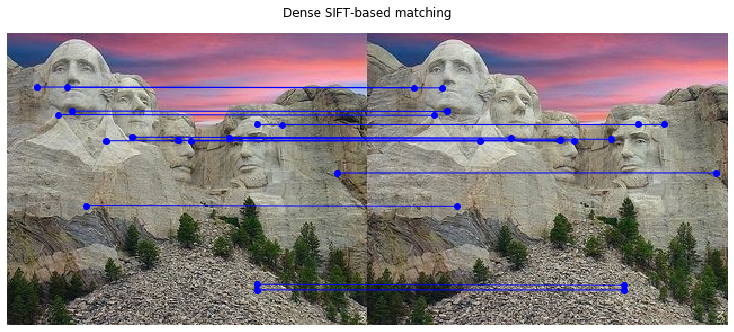

In [108]:
my_draw_matches(rushmore_im[0], rushmore_im[1], rush_sift_subset, "Dense SIFT-based matching")

In [109]:
_,_,_, him_sift_pts1, him_sift_pts2 = perform_sift_match(himalaya_stereo_im[0], himalaya_stereo_im[1], 0.8)

him_sift_points = np.hstack((him_sift_pts1, him_sift_pts2))
him_sift_subset = get_random_sift_points(him_sift_points)

ratio test


720 1280
(720, 1280, 3) (720, 1280, 3)


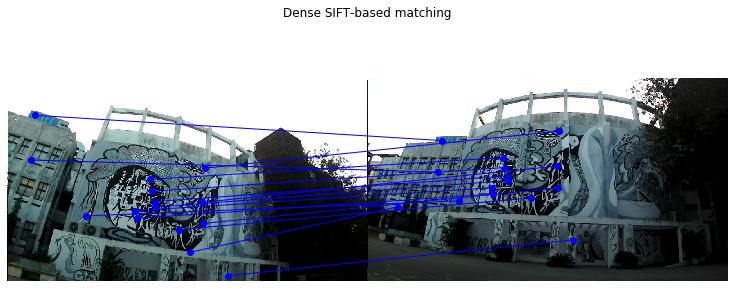

In [110]:
my_draw_matches(himalaya_stereo_im[0], himalaya_stereo_im[1], him_sift_subset, "Dense SIFT-based matching")

In [111]:
_,_,_, taj_sift_pts1, taj_sift_pts2 = perform_sift_match(taj_stereo_im[0], taj_stereo_im[1], 0.5)

taj_sift_points = np.hstack((taj_sift_pts1, taj_sift_pts2))
taj_sift_subset = get_random_sift_points(taj_sift_points)

ratio test


317 725
(317, 725, 3) (318, 743, 3)


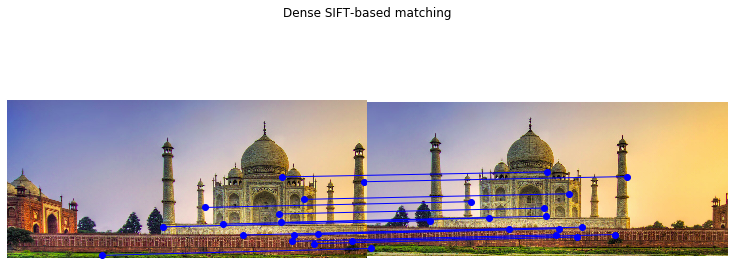

In [112]:
my_draw_matches(taj_stereo_im[0], taj_stereo_im[1], taj_sift_subset, "Dense SIFT-based matching")